<a href="https://colab.research.google.com/github/himu0023/Heart-Disease-Machine/blob/main/dog_breed_predection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification.zip"

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

# 🐶 End to end Multi-class Dog Breed Classifibation

This notebook builds an end-to-end multi-class image classifier using TenserFlow 2.0 and TenserFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed indentification competition.

https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evaluation

The evaluation is a file with prediction probabilities foe each dog breed of each test image.

> Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

## 4. Features

Some information about the data:

* We're dealing with image(unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs(this means there are 120 different classes).

* There are around 10,000+ images in the traning set(these images have labels).

* There are around 10,000+ images in the test set(these images have no labels, because we'll want to predict them).

In [ ]:
# unzip the uploaded data into Google Drive

## Get our workspace ready

* Import TensorFlow 2.x
* Import TEnsorFlow's Hub
* Make sure we're using a GPU

In [ ]:
# import necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YES....!!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

TF version: 2.18.0
TF Hub version: 0.16.1
GPU available (YES....!!)


# Getting our data ready(turing into Tensors)

With all machine learning model, our data has to be in numeric format. So that's what we'll be doing first. Turning our images into Tensors(numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data

import pandas as pd
label_csv= pd.read_csv("drive/MyDrive/Colab Notebooks/Dog Vision/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

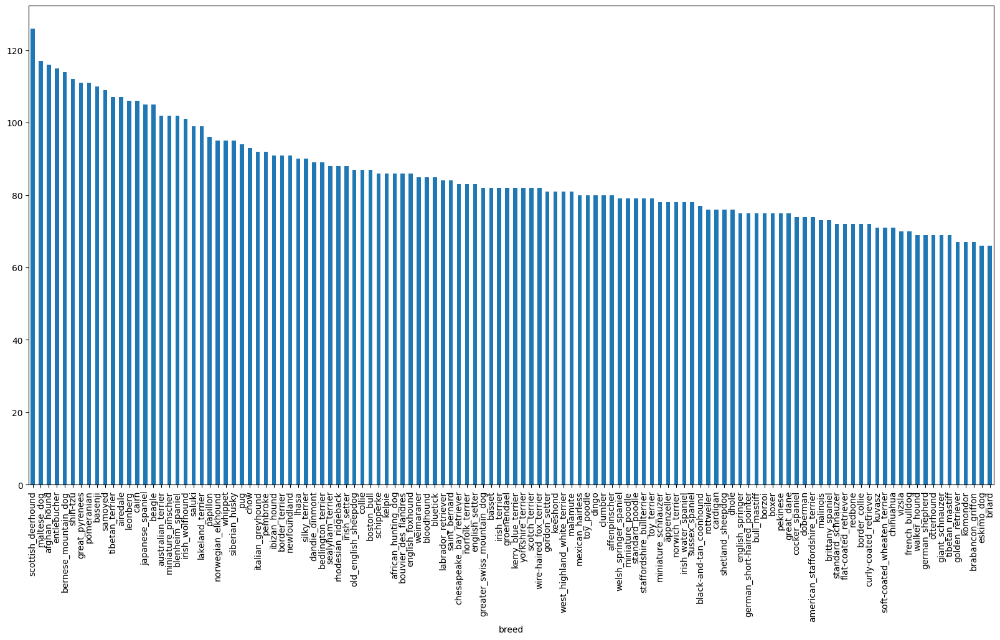

In [ ]:
# How many images are there of each breed?
label_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
label_csv['breed'].value_counts().median()

82.0

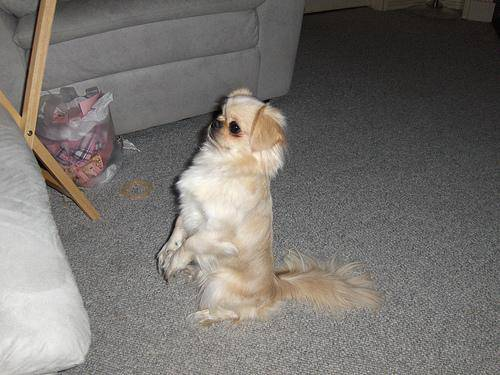

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filename = ["drive/MyDrive/Colab Notebooks/Dog Vision/train/" + fname +".jpg" for fname in label_csv["id"]]

In [ ]:


# Check the first 10
filename[:10]

['drive/MyDrive/Colab Notebooks/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Colab Notebooks/Dog Vision/train")[:10]

['e827e6439b32ea68d51e894a7350c699.jpg',
 'db8cdf3de2c08f37e50c29b89a0bfa2d.jpg',
 'e993788050a70ef538c396f582c3a04c.jpg',
 'ddf85ff807c96d56f25b420fcaa121fe.jpg',
 'e89b8245a8e0dec55c3e6aca21e9b374.jpg',
 'df6731703d42db260e3b070fed033e8f.jpg',
 'e17f3e7d3d1468c34643e60cb622e935.jpg',
 'e4913c578cba8c59d842663fa734d337.jpg',
 'dc19a7f22b2f78763083633f21db6602.jpg',
 'e6d9085fa22d76e3c089cfaea8f39479.jpg']

In [ ]:
# Check whether number of filename matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog Vision/train")) == len(label_csv):
  print("Filenames match actual image count")
else:
  print("Filenames do not match actual image count, check the target directory")

Filenames match actual image count


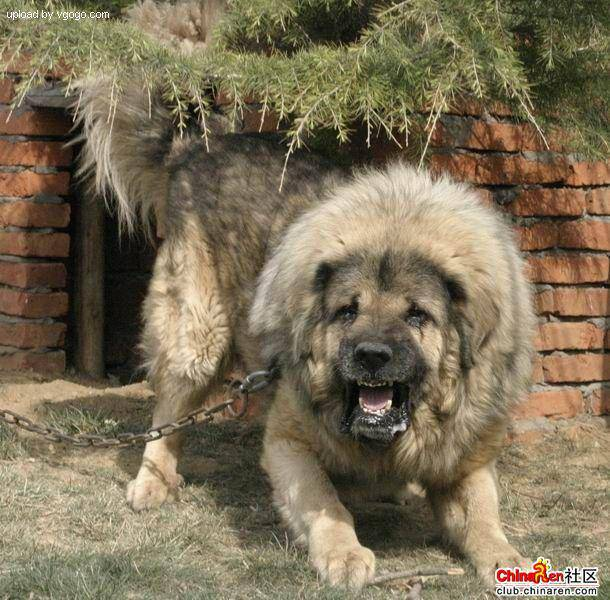

In [ ]:
# One more check
Image(filename[9000])

In [ ]:
label_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our traning image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = label_csv['breed'].to_numpy()
# label = np.array(label) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if the number of labels matches the number of filename
if len(labels)== len(filename):
  print("Number of labels matches the number of filename!")
else:
  print("Number of labels does not match number of filename, check data directories")

Number of labels matches the number of filename!


In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
 # Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occur
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filename[:10]

['drive/MyDrive/Colab Notebooks/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filename
y = boolean_labels

In [ ]:
len(filename)

10222

We're going to start off experimenting with -1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting ,  hyperparameters which we can set as a user are generally set in capitals.
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42
)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Colab Notebooks/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

## Preprocessing Images (turning images into Tensor)

To preprocess our images into Tensores we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TenserFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensor
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [ ]:
# Convert Image to Numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
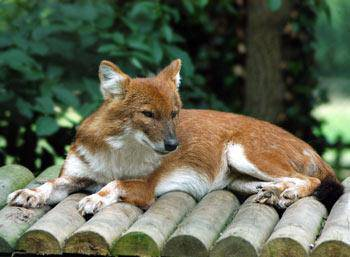

In [ ]:
image

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.
1. Take an `image` filepath as input
2. Use TenserFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensor
4. Normalize our `image` (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
   Takes an image file path and turns the image into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jepg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired values(224,224)
  image= tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why to turn our data into batches?

Let's say your're trying to process 10,000+ images in one go... they all might not fit into memory.

S0, thst's why we do about 32 (batch size) images at a time(you can manually adjust the batch size if need be).

In oreder to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple(number, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42], tf.constant(y[42])))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuple pf Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  # Tip : If you don't know how to write code first write in human understandable language
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print("Creating test data batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only file path (no label)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # label
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating traning data batches...")
    # Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               (tf.constant(y))))
    # Shuffling pathnames and label before mapping images processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batchs
    data_batch = data.batch(batch_size=BATCH_SIZE)
  return data_batch

In [ ]:
# Create traning and validation data batches
train_data =  create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating traning data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an images
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gird line off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

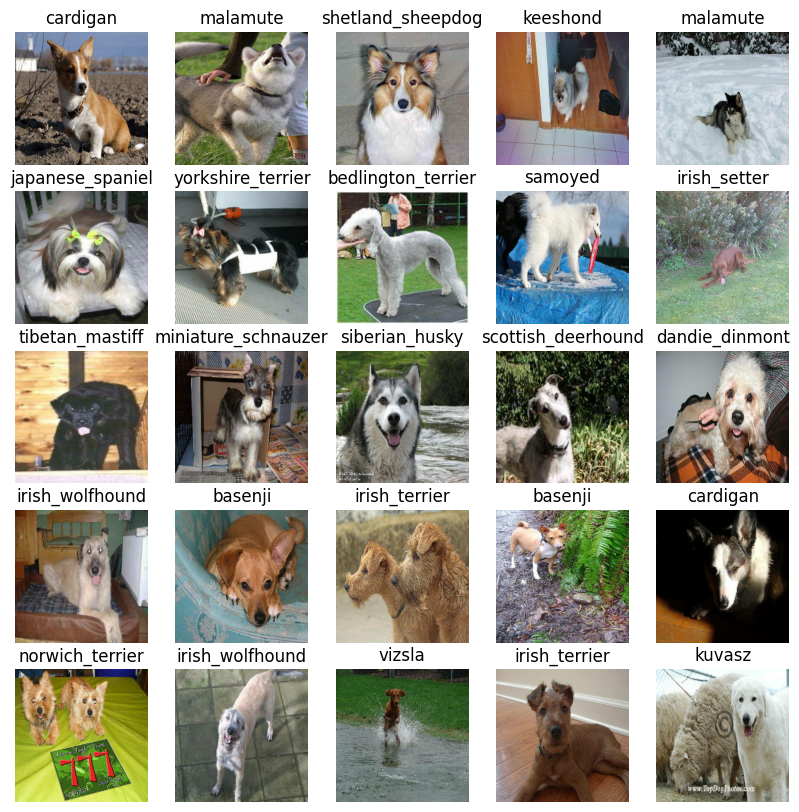

In [ ]:
# Now let's visualize the data in a traning batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

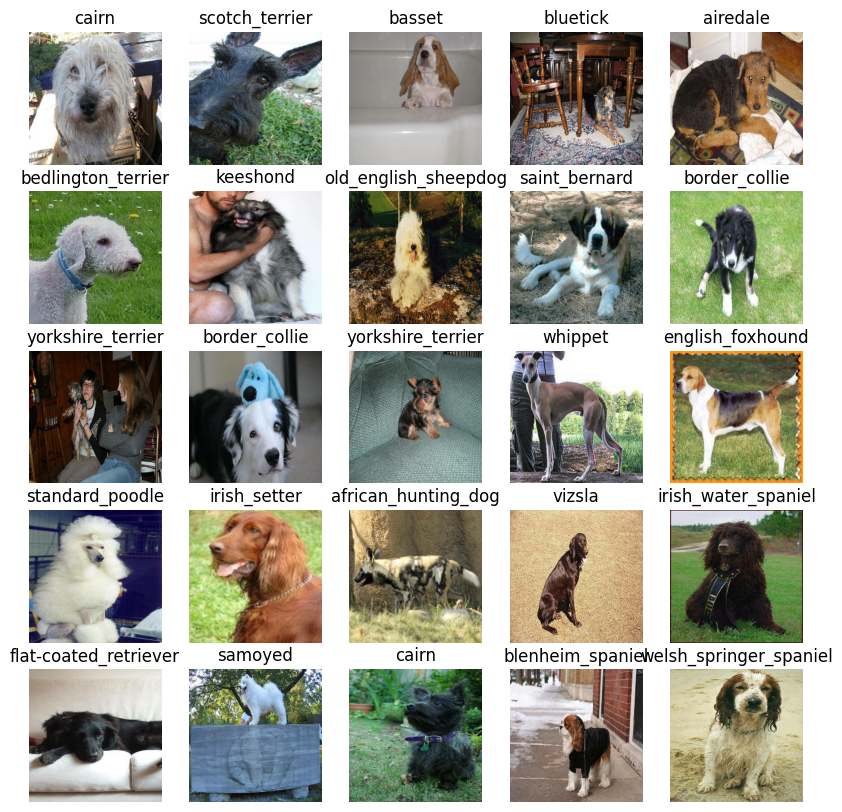

In [ ]:
#Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (Our images shape, in form of Tensors) to our model.
* the output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
IMG_SIZE

224

In [ ]:
# !pip install tf_keras

import tf_keras as keras

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go. Let's put them together inot a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model i sequentiall fashion(do this first, then this, then that).
* Compiles the model(say it should be evaluated and improved).
* Builds the model (tells the model the imput shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the mdoel
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training erarly if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard notebook which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualizer our models training logs with the `%tensorboard` magic function(we'll do this after model traning).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directiry for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps our model from overfitting by stoping training if a certain evaluation metric stops imporving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [ ]:
# Create early stopping callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                              patience=3)

## Traning a model (on subset of data)

Our first model is only going to train on 1000 imagesm to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still runing on a GPU
print("GPU","available (YESS!!!!!)" if tf.config.list_physical_devices("GPU") else "Not avilable")

GPU available (YESS!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard using `create_tensor_callback()`
* Call the `fit()` function on our model passing if the traning data, number of epochs of train for (NUM_EPOCHS) and the callback we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Traning a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorFlow session evertime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callback we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 383s 15s/step - loss: 4.5757 - accuracy: 0.0900 - val_loss: 3.4202 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 5s 184ms/step - loss: 1.6583 - accuracy: 0.6775 - val_loss: 2.1793 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 129ms/step - loss: 0.5834 - accuracy: 0.9337 - val_loss: 1.6663 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 130ms/step - loss: 0.2563 - accuracy: 0.9887 - val_loss: 1.4890 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 153ms/step - loss: 0.1475 - accuracy: 0.9975 - val_loss: 1.4160 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 157ms/step - loss: 0.1010 - accuracy: 1.0000 - val_loss: 1.3657 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

**Question:** It look like our model is overfitting because it's performing far better on the traning dataset than the validation dataset, what are some wats to prevent model overfitting in deep learning networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function(`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data(not to use train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 102ms/step


array([[9.7795445e-03, 3.0049184e-04, 2.1542527e-03, ..., 5.0027121e-04,
        4.1630941e-05, 1.5367606e-03],
       [1.1132503e-03, 1.6763768e-03, 5.5512306e-03, ..., 2.4308838e-04,
        9.4816869e-04, 6.9126974e-05],
       [8.6927685e-06, 2.9900677e-05, 5.6447443e-06, ..., 8.9544206e-05,
        7.5072821e-06, 4.5563313e-05],
       ...,
       [1.9683666e-05, 1.4259441e-04, 4.1271036e-05, ..., 5.2126816e-05,
        2.5395583e-04, 2.9499031e-04],
       [4.0028514e-03, 1.7382679e-04, 1.0040673e-04, ..., 1.3128256e-04,
        1.5483257e-04, 1.5828536e-03],
       [1.7322192e-03, 1.3430786e-04, 1.4781462e-03, ..., 1.1733616e-03,
        6.1750284e-04, 5.3066447e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

np.float32(1.0)

In [ ]:
# First prediction
index = 14
print(predictions[index])
print(f"Max value (probability of prediciton): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.65254091e-04 2.02119554e-05 5.29014942e-05 1.05883992e-04
 3.87305859e-03 8.41564251e-05 1.01655512e-03 1.42924977e-03
 6.36267662e-03 1.20939232e-01 6.80052908e-05 4.62740099e-05
 1.14784983e-03 1.78136479e-03 3.23220331e-04 9.51983908e-04
 1.02360609e-04 5.76577382e-04 1.50656037e-04 2.85005837e-04
 4.97959787e-04 9.88845713e-04 1.64256926e-04 9.22459149e-05
 1.15528302e-02 1.24099650e-04 1.54477602e-05 6.12044969e-05
 1.39404903e-04 2.28564495e-05 1.11266731e-04 5.80208551e-04
 2.53084116e-04 1.45523576e-04 1.06636915e-04 2.94126803e-05
 4.50007756e-05 1.44079953e-04 1.78665854e-04 7.01073587e-01
 2.20575882e-03 1.68624701e-05 2.18139170e-03 9.78504104e-05
 4.91979416e-04 7.83506039e-05 1.45226193e-03 6.91717083e-04
 8.23404916e-05 3.97992233e-04 1.63895402e-05 8.50819561e-05
 1.12139503e-04 6.94235205e-04 1.33159963e-04 1.04422709e-02
 2.21698545e-04 3.00742249e-04 1.23793521e-04 3.26654408e-05
 1.80715011e-04 3.57694505e-03 2.74882022e-05 2.24983727e-04
 1.16219075e-04 3.600984

In [ ]:
# Second prediction
index =42
print(predictions[index])
print(f"Max value (probability of prediciton): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.53246020e-04 1.43293350e-04 1.68961633e-04 9.64989376e-05
 2.93719978e-03 1.00528072e-04 1.57390241e-04 1.95140624e-03
 2.35736324e-03 1.06508881e-01 3.57749959e-05 2.80539898e-05
 5.93041303e-04 1.03035034e-03 5.36468811e-04 1.61988218e-03
 4.94598280e-05 8.85174086e-04 7.44148711e-05 2.06699100e-04
 4.36886694e-05 5.50569792e-04 1.40471166e-04 2.76898372e-05
 8.37103929e-03 3.41419509e-04 4.25445942e-05 2.31852377e-04
 2.65818526e-04 1.12557491e-05 4.08320193e-05 8.43533344e-05
 5.40122419e-05 4.75274610e-05 7.26498183e-05 1.22599613e-05
 3.44084314e-04 2.88396259e-04 7.24215352e-05 3.66841823e-01
 1.85425481e-04 4.88082605e-06 3.09711322e-03 1.19292235e-05
 2.19418100e-04 7.32634799e-05 2.46445241e-04 7.94240215e-04
 3.91480025e-05 7.08827109e-04 1.87739079e-05 1.93669930e-05
 1.15102064e-03 2.49500852e-03 1.23885009e-04 2.52681784e-03
 1.63004268e-04 1.68253726e-04 1.69237792e-05 5.14661515e-05
 8.67151830e-05 1.04122947e-03 2.18318291e-05 1.49945030e-04
 1.60502517e-04 1.437365

Having the above functionality is greate but we want to be able to do it at scale.

And it would be better if we could see the prediction is being made on!

**Note:**Prediction probabilities are known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label(easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicred label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatachify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns seprate arrays of image and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels =  unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize

We'll create a function which:
* Take an array of prediction probabilities, an array of truth labels and array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicited label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label =  get_pred_label(pred_prob)

  #Plot the image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or worng
  if pred_label== true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:.2f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                    color=color)


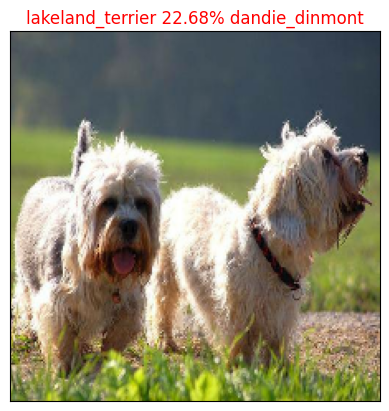

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=65)

Now we've got one function to visualize our model top prediction, let's make another to view our models top 10 predicitons.

This function will:
* Take an input of prediciton probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
   * Prediction probabilities indexes
   * Prediction probabilities values
   * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green   

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediciton confiendce indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # FInd the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

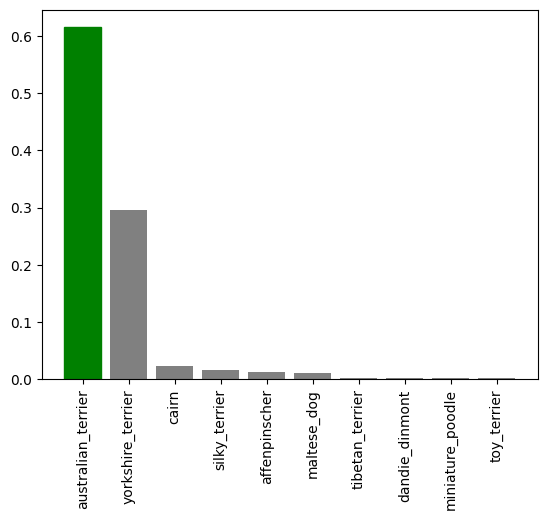

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=98)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

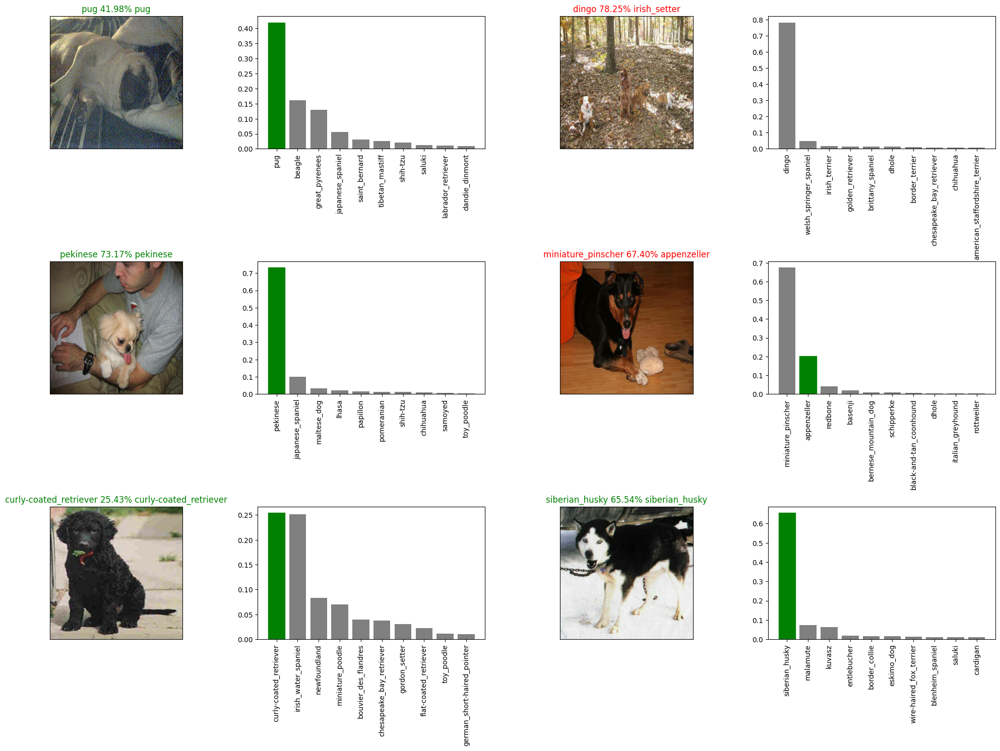

In [ ]:
# Let's check out a few predictions and their differnet values
i_multiplier = 80
num_rows=3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=0.1)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predicitons and true labels?

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

val_data = create_data_batches(X_val, y_val, valid_data=True)
y_pred_probs = model.predict(val_data)
y_pred = np.argmax(y_pred_probs, axis=1)
cm = confusion_matrix(np.argmax(y_val, axis=1), y_pred)

Creating validation data batches...
7/7 [==============================] - 1s 108ms/step


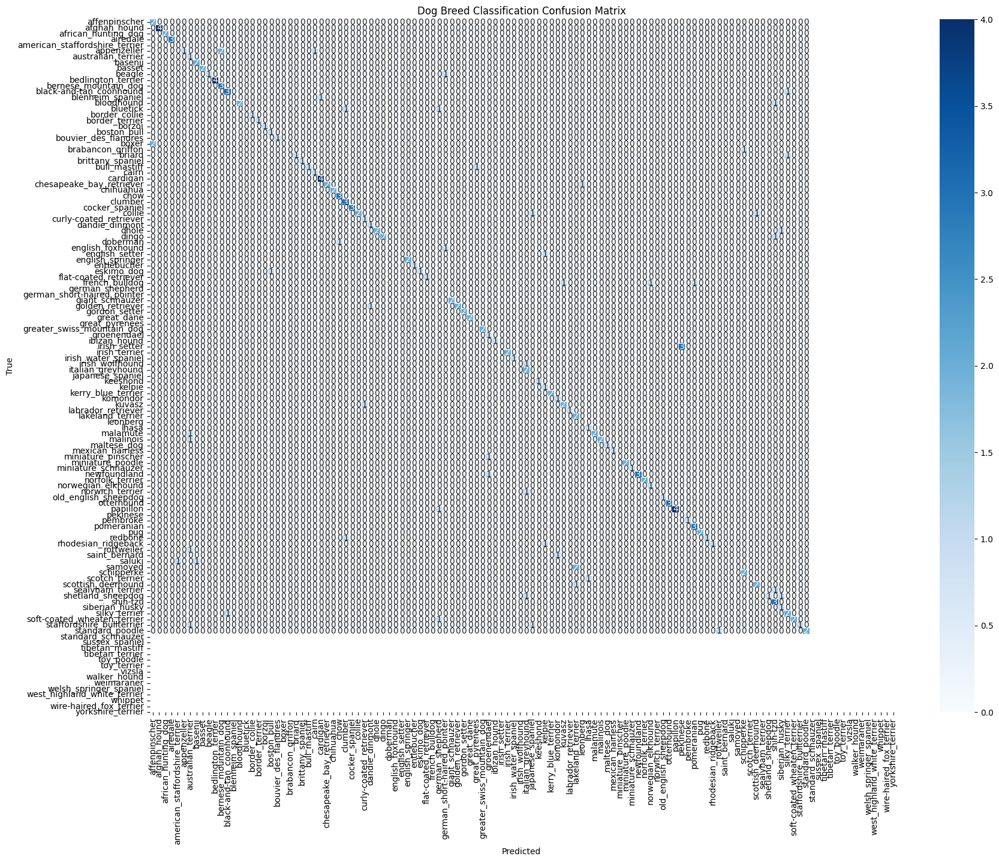

In [ ]:
plt.figure(figsize=(20,15))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=unique_breeds,
            yticklabels=unique_breeds)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Dog Breed Classification Confusion Matrix')
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (stting).
  """
  # Create a model directory pathname with current time
  modeldir= os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".keras" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got funcitons to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-10131744280026_1000-images-Adam.keras...


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-10131744280026_1000-images-Adam.keras'

In [ ]:
loaded_1000_images_model =load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-10131744280026_1000-images-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-10131744280026_1000-images-Adam.keras


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 75ms/step - loss: 1.2945 - accuracy: 0.6600


[1.2944592237472534, 0.6600000262260437]

In [ ]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 2s 89ms/step - loss: 1.2511 - accuracy: 0.6600


[1.2511355876922607, 0.6600000262260437]

## Traning a model(on the full data)

Now we know our model works on subset of the data, we can start to move forward with trainig one on the full data.

Above, we saved all of the traning filpaths to `X` and all of the traning lables to`y`.

In [ ]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [ ]:
# Turn full traning data in a data batch
full_data = create_data_batches(X, y)

Creating traning data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set within training on all the data, so we can't validation accuacy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

**Note:** Running the cell below will take a little while(maybe up to 30 minutes for first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to full data
#  full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1758s 5s/step - loss: 1.3026 - accuracy: 0.6784
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 0.3975 - accuracy: 0.8825
Epoch 3/100
320/320 [==============================] - 30s 93ms/step - loss: 0.2350 - accuracy: 0.9373
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1519 - accuracy: 0.9624
Epoch 5/100
320/320 [==============================] - 29s 92ms/step - loss: 0.1052 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 28s 89ms/step - loss: 0.0765 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0606 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0453 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0376 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - 29s 90ms/step - l

In [ ]:
# save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-12351744288551_full-image-set-mobilenetv2-Adam.keras...


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-12351744288551_full-image-set-mobilenetv2-Adam.keras'

In [ ]:
# Load in the full model
load_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-12351744288551_full-image-set-mobilenetv2-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/20250410-12351744288551_full-image-set-mobilenetv2-Adam.keras


## Making prediction on the test dataset

Sice our model has been trained on images fn the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filename as input an dconver then into Tensor batches.

To make predicitons on the test data, we'll:
* Get the test image filenames.
* Convert the filename into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (Since the test data doesn't have labels).
* Make a prediction array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test images filename
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e732916519751eaa0cb2ba0cc1217ab9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/dca9642123204fd3df080147b05e4af3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e53b2f4211fb7a34aeaa04974b919f6d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e1ada9b155a5903bc6475255d012f681.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e35bb9ec7ff4410f0fb097569af4e66a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/ddbdd621e79563a56443a0dd1ee4c48d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e27567e188000db387977cdb9bbdcf82.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/test/dfc9bcbafc1e249cd07a25c8f50384e0.jpg']

In [ ]:
len(test_filename)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filename, test_data=True)

Creating test data batches.....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run(about an ~1hour)

In [ ]:
# Make prediciton on test data batch using the loaded full model
# test_predictions = load_full_model.predict(test_data,
#                                            verbose=1)

324/324 [==============================] - 1908s 6s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# laod predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.22392168e-12, 3.21051952e-12, 2.25362052e-15, ...,
        1.99885003e-14, 6.84545823e-12, 1.53050853e-11],
       [3.35059376e-11, 5.29811359e-06, 1.00872826e-11, ...,
        1.20722521e-11, 4.96245276e-12, 2.36904968e-10],
       [4.31672113e-13, 9.99999285e-01, 5.09539799e-10, ...,
        2.44253340e-10, 3.80704019e-12, 7.98825561e-10],
       ...,
       [1.40120744e-13, 1.45951797e-16, 8.13497048e-11, ...,
        8.40941032e-13, 7.76855663e-12, 4.22171089e-15],
       [4.28916958e-10, 1.99704555e-08, 2.27423594e-10, ...,
        1.42027234e-08, 1.35683641e-03, 9.99206318e-09],
       [7.67680831e-07, 1.77886497e-10, 1.96679539e-09, ...,
        9.92669058e-10, 1.74807422e-08, 5.72022125e-02]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle submission, we find that if wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview

To get the data in this format, we'll:
* Create  a oandas DataFrame with an ID cloumn as well as a column for each dog breed
* And data to the ID column by extracting the test image ID's from their filpaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to the Kaggle.

In [ ]:
# ["id"]+list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test images ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e732916519751eaa0cb2ba0cc1217ab9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dca9642123204fd3df080147b05e4af3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e53b2f4211fb7a34aeaa04974b919f6d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2f94ad185a2cfa2311c66c3e8bdba17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1ada9b155a5903bc6475255d012f681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e732916519751eaa0cb2ba0cc1217ab9,1.223922e-12,3.210520e-12,2.253621e-15,1.441117e-13,1.018076e-13,1.045613e-11,9.061099e-12,1.192727e-12,4.885790e-10,...,7.052499e-12,8.435665e-16,7.036761e-13,2.154338e-13,2.382553e-13,4.312955e-09,1.237508e-13,1.998850e-14,6.845458e-12,1.530509e-11
1,dca9642123204fd3df080147b05e4af3,3.350594e-11,5.298114e-06,1.008728e-11,7.255076e-11,1.621254e-12,4.771088e-16,3.089229e-09,1.494041e-14,1.107975e-15,...,1.513395e-14,5.510359e-14,2.264622e-15,8.452560e-13,5.732383e-13,1.896959e-14,9.338099e-15,1.207225e-11,4.962453e-12,2.369050e-10
2,e53b2f4211fb7a34aeaa04974b919f6d,4.316721e-13,9.999993e-01,5.095398e-10,1.449341e-10,1.687865e-13,3.235536e-13,2.767054e-12,1.339646e-11,1.757693e-11,...,8.100605e-12,1.884176e-12,3.949938e-12,5.300708e-11,4.028784e-11,4.307522e-11,6.344336e-14,2.442533e-10,3.807040e-12,7.988256e-10
3,e2f94ad185a2cfa2311c66c3e8bdba17,5.447017e-06,4.950446e-08,4.221007e-10,1.469407e-12,3.026865e-10,8.839223e-12,2.810022e-10,1.149518e-09,2.928943e-09,...,7.992326e-11,1.717944e-08,3.474863e-09,2.476128e-08,6.329183e-11,3.588360e-10,2.372659e-09,5.805690e-12,2.388856e-07,3.571732e-07
4,e1ada9b155a5903bc6475255d012f681,5.150021e-07,9.622179e-10,1.711558e-12,3.466403e-08,1.760568e-09,9.758268e-13,4.124734e-07,4.418695e-09,1.505374e-08,...,2.463292e-07,1.657489e-08,1.739849e-07,6.538593e-06,4.567639e-08,2.277313e-10,3.277557e-09,1.966192e-09,2.433985e-03,1.440809e-05


In [ ]:
# Save our predicitons dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/full_model_predictions_submission_1_moblienetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepath of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And sice our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepath
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dogs/Screenshot 2025-04-12 225952.png',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dogs/Screenshot 2025-04-12 225937.png',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dogs/Screenshot 2025-04-12 225943.png',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/my_dogs/Screenshot 2025-04-12 225907.png']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches.....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make prediction on the custom data
custom_preds = load_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get custom image prediciton labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['norwich_terrier', 'german_shepherd', 'newfoundland', 'dhole']

In [ ]:
# Get custom images(our unbatchify() function won't work since there aren't labels... maybe we colud fix this later)
custom_images= []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

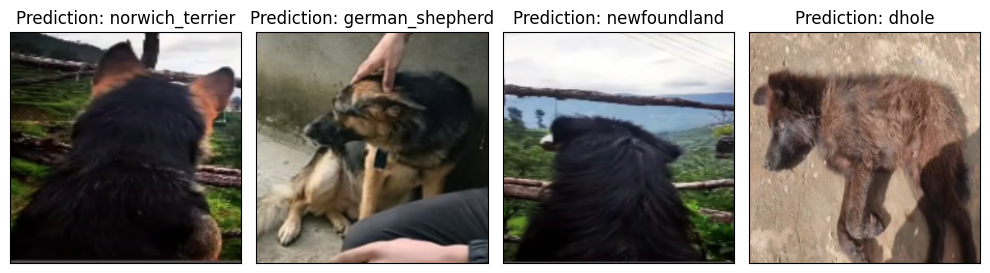

In [ ]:
# Check custom images predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {custom_pred_labels[i]}")
  plt.tight_layout(h_pad=0.2)
  plt.imshow(image)